In [1]:
import sys
sys.path.append('../code/functions/')
import tiffIO as io

import cv2
import time
import pickle

import numpy as np
import multiprocessing as mp
import matplotlib.pyplot as plt

from chanvese import chanvese
from skimage.measure import label
from skimage.filters import threshold_otsu as otsu
from skimage.filters import sobel
from skimage.transform import pyramid_expand, pyramid_reduce

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

In [3]:
data = io.loadTiff('../data/rr46b_s0_ch1.tif')
data.shape

(65, 1024, 1024)

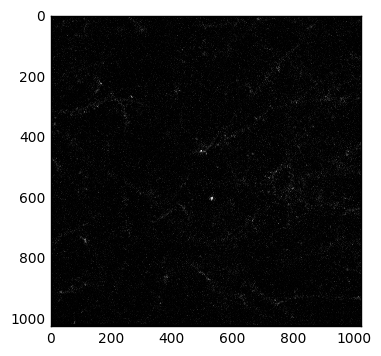

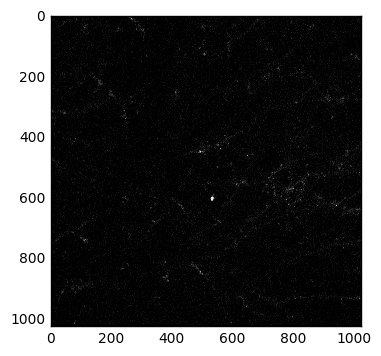

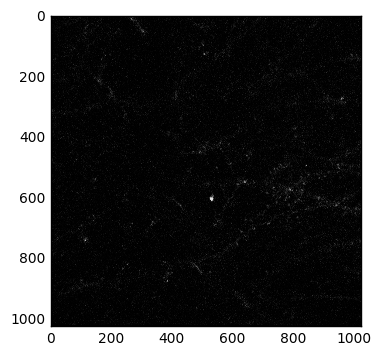

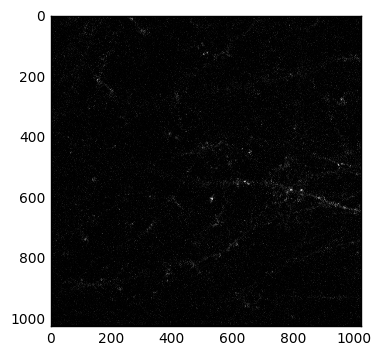

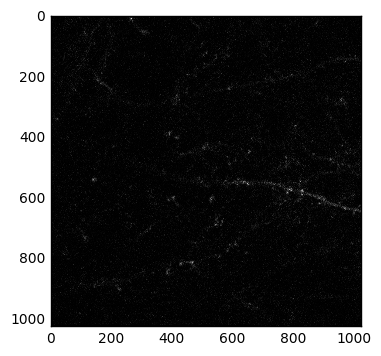

In [10]:
for i in range(25, 30):
    plt.figure()
    plt.imshow(data[i], cmap='gray')
    plt.show()


In [11]:
def binaryThreshold(img, percentile=90):
    img = (img/256).astype('uint8')
    threshImg = np.zeros_like(img)
    percentile = np.percentile(img, percentile)
    for i in range(len(img)):
        threshImg[i] = cv2.threshold(img[i], percentile, 255, cv2.THRESH_TOZERO)[1]
    return threshImg

def adaptiveThreshold(inImg, sx, sy):
    max = np.max(inImg)
    outImg = np.zeros_like(inImg)
    shape = outImg.shape
    sz = shape[0]
    subzLen = shape[0]/sz
    subYLen = shape[1]/sy
    subxLen = shape[2]/sx
    for zInc in range(1, sz + 1):
        for yInc in range(1, sy + 1):
            for xInc in range(1, sx + 1):
                sub = inImg[(zInc-1)*subzLen: zInc*subzLen, (yInc-1)*subYLen: yInc*subYLen, (xInc-1)*subxLen: xInc*subxLen]
                subThresh = binaryThreshold(sub, 90)
                outImg[(zInc-1)*subzLen: zInc*subzLen, (yInc-1)*subYLen: yInc*subYLen, (xInc-1)*subxLen: xInc*subxLen] = subThresh
    return outImg

In [12]:
adaptive = adaptiveThreshold(data[25:30], 10, 10)

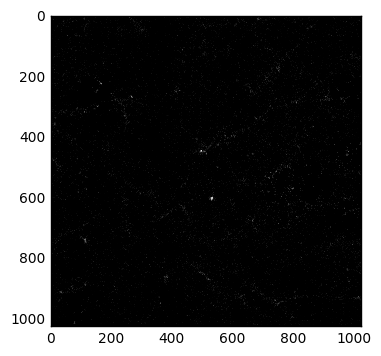

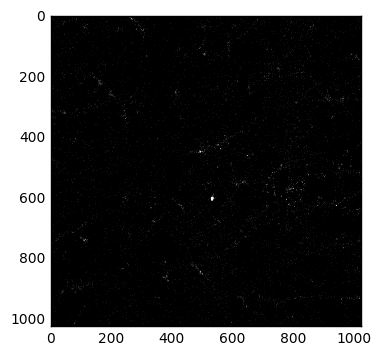

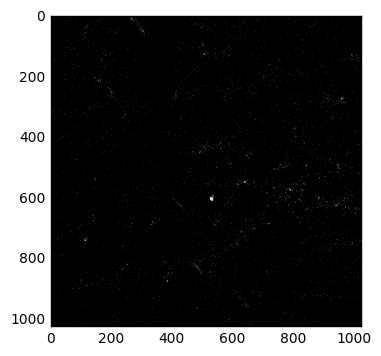

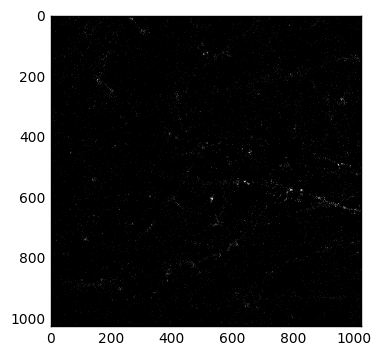

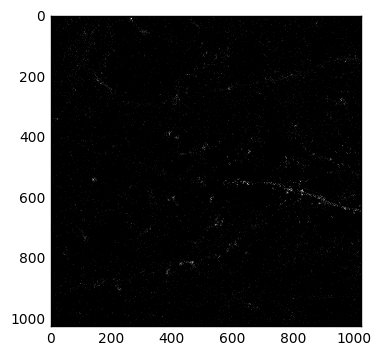

In [13]:
for i in adaptive:
    plt.figure()
    plt.imshow(i, cmap='gray')
    plt.show()

# This is bad
The first step of our pipeline is already ill suited to the new data. The way to procede from here, I think, is to first identify axons, and then check around them for synapses

## First, just look at it

In [14]:
axonImg = data[34, 300:600, 200:600]

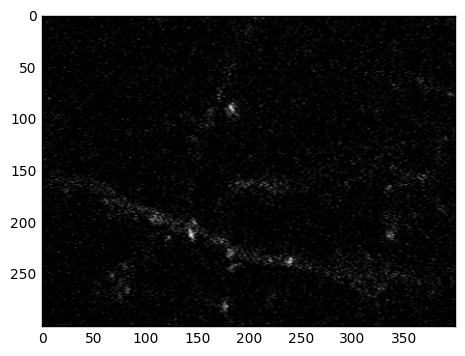

In [15]:
plt.figure()
plt.imshow(axonImg, cmap = 'gray')
plt.show()

In [16]:
def nthAve(img, n, stepY, stepX):
    #divide the image
    out = np.zeros_like(img)
    for yStart in range(0, img.shape[0], stepY):
        curRow = []
        for xStart in range(0, img.shape[1], stepX):
            sub = img[yStart:yStart+stepY, xStart:xStart+stepX]
            out[yStart:yStart+stepY, xStart:xStart+stepX] = np.average(sub)**n
    return np.stack(out)

In [17]:
nthImg = nthAve(axonImg, 2, 10, 10)

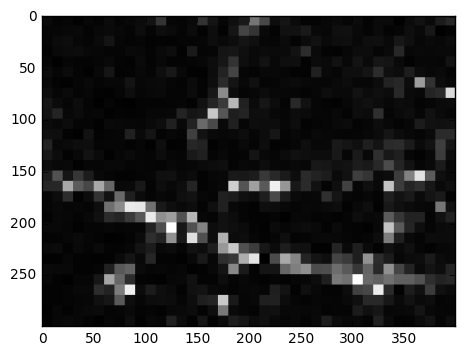

In [18]:
plt.figure()
plt.imshow(nthImg, cmap = 'gray')
plt.show()

## This looks promising:
let's dilate and use it as a mask to find the axons

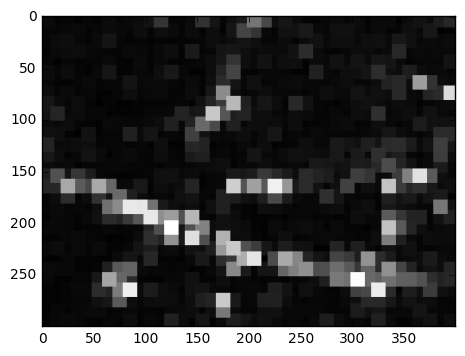

In [19]:
dil = cv2.dilate(nthImg, None, iterations=2)
plt.figure()
plt.imshow(dil, cmap = 'gray')
plt.show()

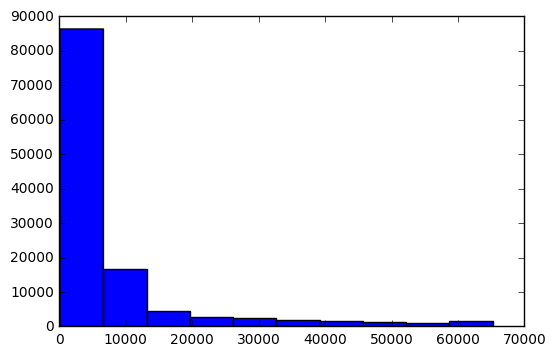

In [20]:
plt.figure()
plt.hist(dil.flatten())
plt.show()

Histogram shows a clear bimodality - this is good, but I'm afraid disregarding the long right tail will make us miss too many things in the first pass. I will start by checking results in a non-zero mask, and then move from there

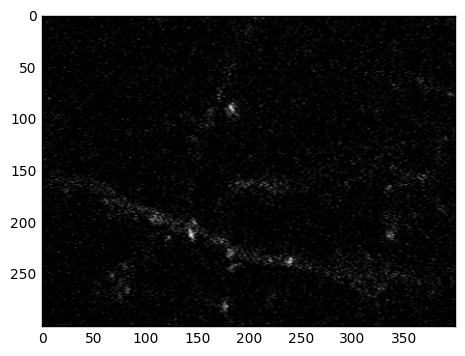

In [21]:
mask = dil > 0
axonProxImg = axonImg * mask
plt.figure()
plt.imshow(axonProxImg, cmap='gray')
plt.show()

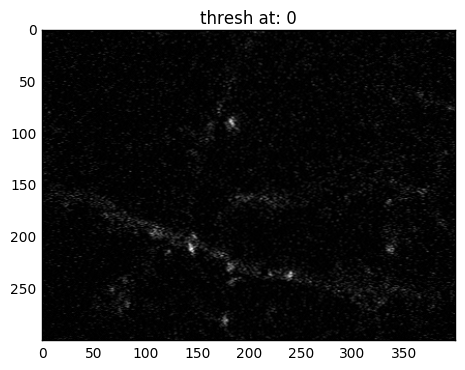

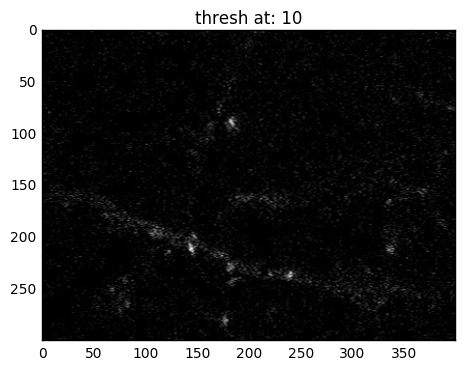

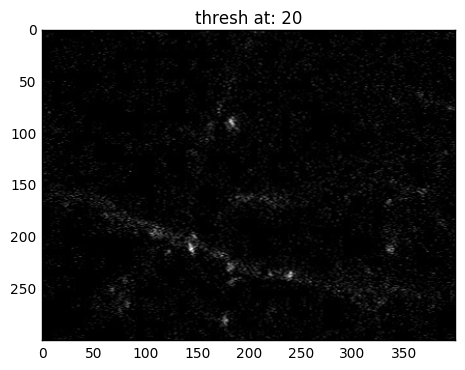

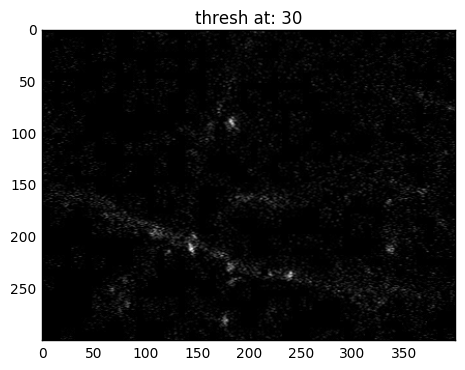

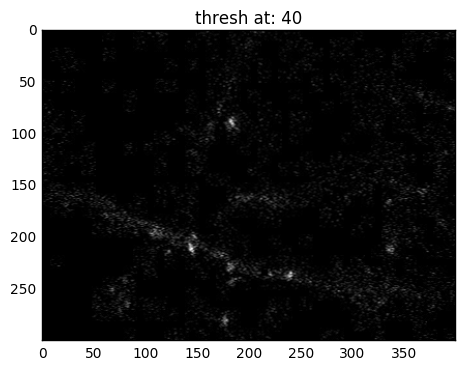

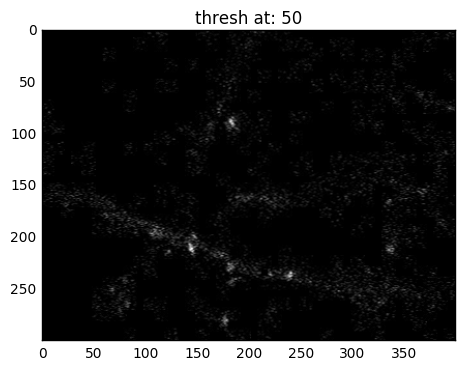

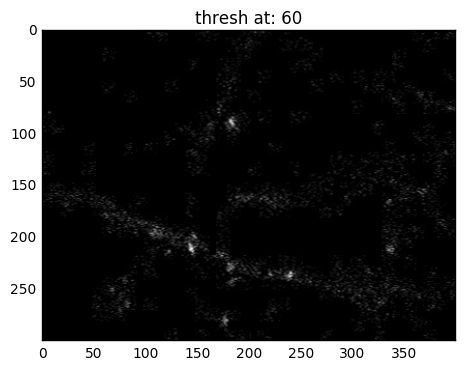

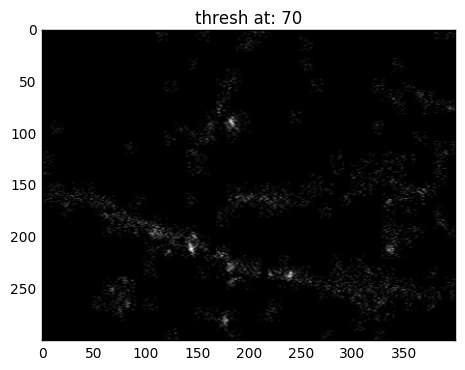

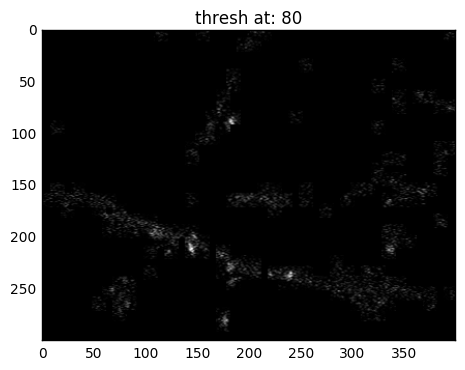

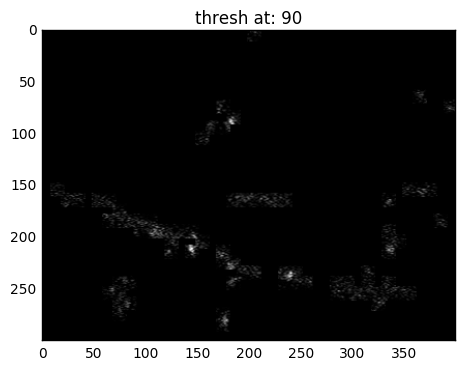

In [22]:
for i in range(0, 100, 10):

    mask = dil > np.percentile(dil, i)
    axonProxImg = axonImg * mask
    plt.figure()
    plt.imshow(axonProxImg, cmap='gray')
    plt.title('thresh at: '+str(i))
    plt.show()

Qualitatively, 80th percentile looks like the best cutoff. The data seems to follow a zipf distribution, so let's see if the '80-20' rule holds

In [23]:
print np.percentile(dil, 80)

9502.0


In [24]:
np.max(dil)

65213

In [25]:
65213. * .2

13042.6

As expected, 20% of the index of the data is about the best qualitative threshold. For this reason, we chose to continue on with the  80% threshold.

We choose not to use 20%  of the index as our metric since it is sensitive to high data outliers

Now that we have an idea of how to get the axons out, let's apply it to the whole stack and see if it holds

In [26]:
def extractAxons(imgStack):
    axonProxStack = []
    
    for img in imgStack:
        nthImg = nthAve(img, 2, 10, 10)
        dil = cv2.dilate(nthImg, None, iterations=2)
        mask = dil > np.percentile(dil, 80)
        axonProxImg = img * mask
        axonProxStack.append(axonProxImg)
        
    return np.stack(axonProxStack)

In [27]:
start = time.time()
axonImg = extractAxons(data)
end = time.time()
print "Function call took: ", end - start

Function call took:  24.6399550438


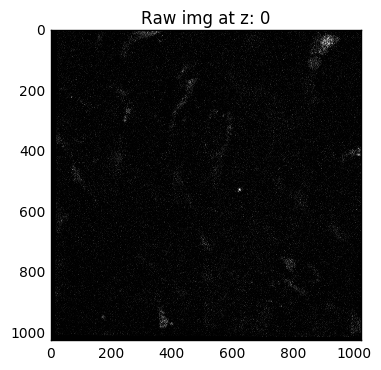

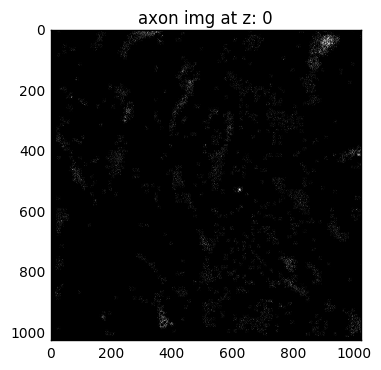

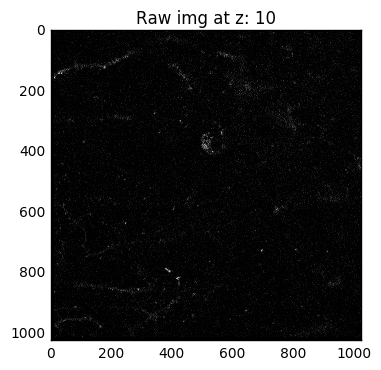

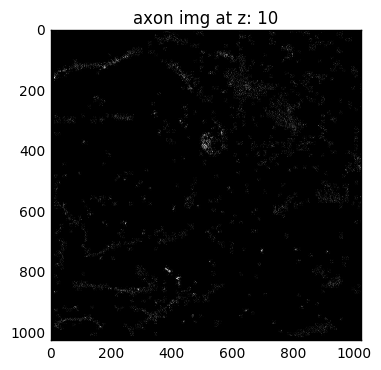

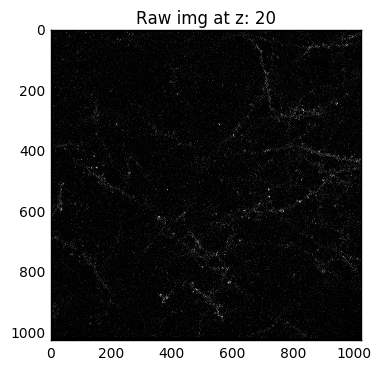

...

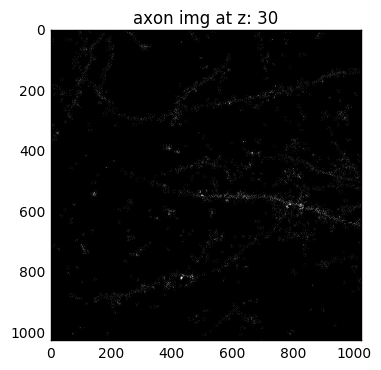

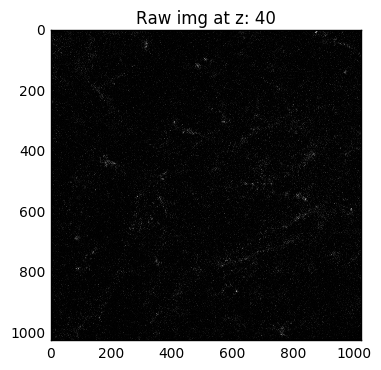

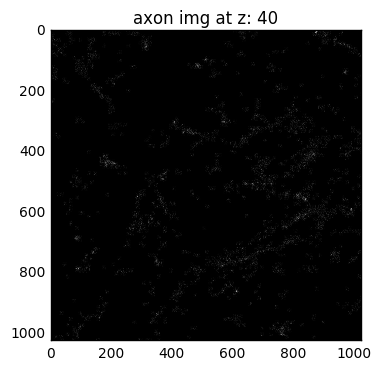

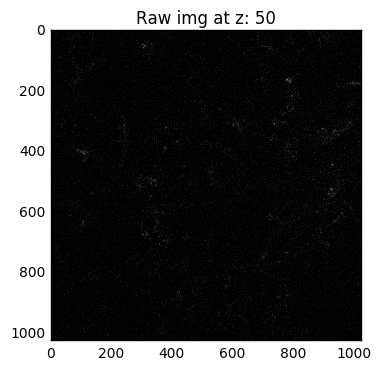

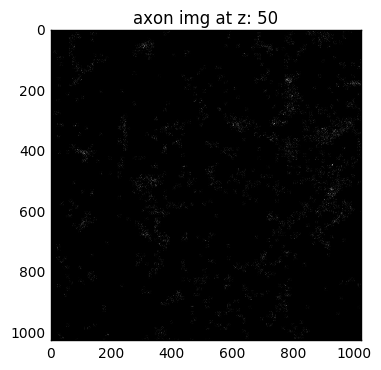

In [28]:
for i in range(0, 60, 10):
    plt.figure()
    plt.imshow(data[i], cmap='gray')
    plt.title('Raw img at z: '+ str(i))
    plt.show()
    
    plt.figure()
    plt.imshow(axonImg[i], cmap='gray')
    plt.title('axon img at z: '+ str(i))
    plt.show()
    print '\n\n\n\n'


# This looks good

The only thing that I'm worried about now is that some of the images dont really have axons. To combat this, I will first take a look at the distributions associated with the axon images

In [29]:
def extractAxons(imgStack):
    axonProxStack = []
    nthStack = []
    
    for img in imgStack:
        nthImg = nthAve(img, 2, 10, 10)
        dil = cv2.dilate(nthImg, None, iterations=2)
        mask = dil > np.percentile(dil, 80)
   
        axonProxImg = img * mask
        axonProxStack.append(axonProxImg)
   
        nthStack.append(nthImg)

    return np.stack(axonProxStack), np.stack(nthStack)

Function call took:  24.7997682095


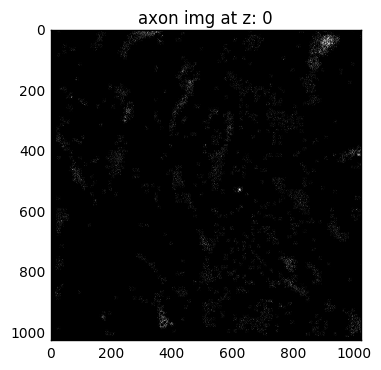

KeyboardInterrupt: 

In [30]:
start = time.time()
axonImg, histStack = extractAxons(data)
end = time.time()
print "Function call took: ", end - start

for i in range(0, 60, 10):
    
    plt.figure()
    plt.imshow(axonImg[i], cmap='gray')
    plt.title('axon img at z: '+ str(i))
    plt.show()

    plt.figure()
    plt.hist(histStack[i])
    plt.title('nthPower hist at z: '+ str(i))
    plt.show()
    
    print '\n\n\n\n'


These histograms show little substantial differentiation. This may be due to some sort of gradient on the image

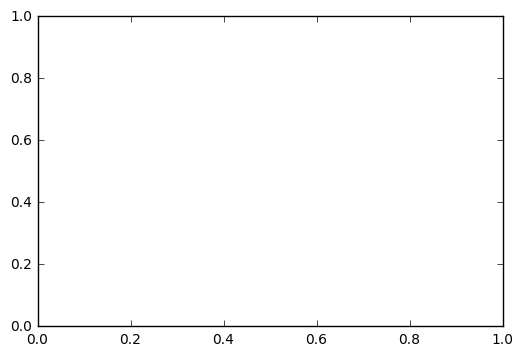

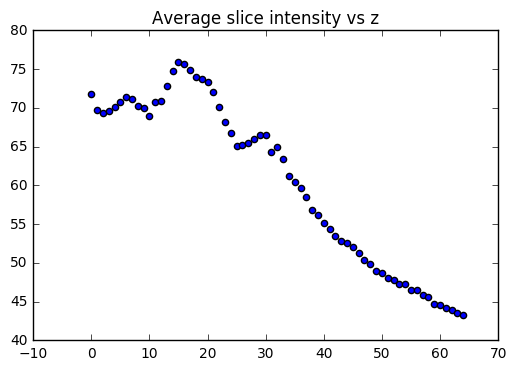

In [31]:
plt.figure()
plt.scatter([i for i in range(65)], [np.average(data[i]) for i in range(65)])
plt.title('Average slice intensity vs z')
plt.show()

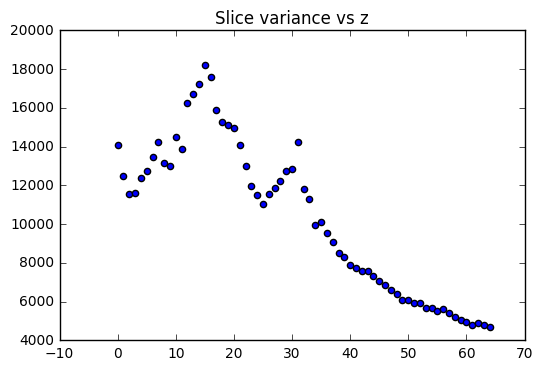

In [32]:
plt.figure()
plt.scatter([i for i in range(65)], [np.var(data[i]) for i in range(65)])
plt.title('Slice variance vs z')
plt.show()

# Let's just try normalization!

It should not matter in terms of the local slice results if I normalize the volume, since everything is based off of local percentile

for the reasons discussed in our prior notebook, we are opting to use a mean shift norm for this task

In [ ]:
def meanShiftNorm(volume):
    idealMean = np.average(volume[0])
    return np.stack([plane + (idealMean - np.average(plane)) for plane in volume])

In [ ]:
start = time.time()
axonImg, histStack = extractAxons(meanShiftNorm(data))
end = time.time()
print "Function call took: ", end - start

for i in range(0, 60, 10):
    
    plt.figure()
    plt.imshow(axonImg[i], cmap='gray')
    plt.title('axon img at z: '+ str(i))
    plt.show()

    plt.figure()
    plt.hist(histStack[i])
    plt.title('nthPower hist at z: '+ str(i))
    plt.show()
    
    print '\n\n\n\n'


In [ ]:
dataNorm = meanShiftNorm(data)
for i in range(0, 60, 10):
    
    plt.figure()
    plt.imshow(dataNorm[i], cmap='gray')
    plt.title('Raw img at z: '+ str(i))
    plt.show()
    
    plt.figure()
    plt.imshow(axonImg[i], cmap='gray')
    plt.title('axon img at z: '+ str(i))
    plt.show()
    print '\n\n\n\n'


Based on the poor qualitative results for norming, as well as the lack of use in differentiating histograms, we will remain with no slice based norm of the data

Obviously it is non optimal that the artifacts at the edges of the slice are present, but I will continue now under the assumption that something can be written to remove them

## Actual synapse detection

For the actual synapse detection, I think that a funtion of proximity to an axon is the way to start. As beforee, I will prototype with the nice slice of the image

In [ ]:
axonImg = data[34, 300:600, 200:600]

In [ ]:
plt.figure()
plt.imshow(axonImg, cmap='gray')
plt.show()

In [ ]:
axonThresh, _ = extractAxons([axonImg])

In [ ]:
plt.figure()
plt.imshow(axonThresh[0], cmap='gray')
plt.show()

Thresholding looks good. Next step is to apply some kind of contouring such that I can separate the dendrites and get a distance metric for the synapses

this looks like a job for the chan vese algorithm, which is used commonly for separating objects with fuzzy boundaries

In [ ]:
seg, _, _ = chanvese(axonThresh[0], axonThresh[0] > 0)

In [ ]:
plt.figure()
plt.imshow(seg, cmap='gray')
plt.show()

This looks very promising. we can now evaluate the image on a by segent basis, which is great since we now have associated axons for each segment

before that, though, id like to try a quick preprocessing step to smooth out the image contours. By running a dilation on the input image mask, I may be able to facilitate more continuous bonding of countours


In [146]:
seg, _, _ = chanvese(axonThresh[0],
                     cv2.dilate(axonThresh[0], None, iterations=5))


iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 100
iteration: 110
iteration: 120
iteration: 130
iteration: 140
iteration: 150
iteration: 160
iteration: 170
iteration: 180
iteration: 190


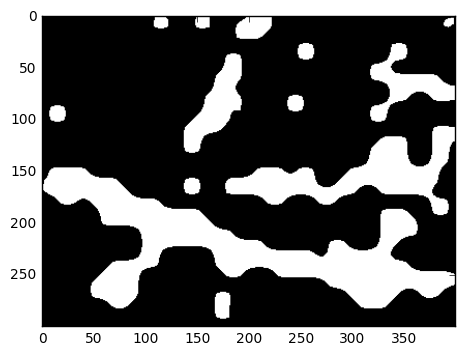

In [147]:
plt.figure()
plt.imshow(seg, cmap='gray')
plt.show()

As I expected, this gave us a much cleaner axon segmentation. Now to combine the steps and apply it to the entire image

In [158]:
def segmentAxons(imgStack, dils=5):
    retStack = []
    for img in imgStack:
        mask = cv2.dilate(img, None, dils)
        seg, _, _ = chanvese(img, mask)
        retStack.append(seg)
    return np.stack(retStack)

In [160]:
start = time.time()
axonImg, _ = extractAxons(data)
end = time.time()
print "Axon Extraction Took: ", end - start

Axon Extraction Took:  22.3053350449


In [161]:
start = time.time()
segmentedVolume = segmentAxons(axonImg)
end = time.time()
print "Axon Segmentation Took: ", end - start

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 100
iteration: 110
iteration: 120
iteration: 130
iteration: 140
iteration: 150
iteration: 160
iteration: 170
iteration: 180
iteration: 190
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 100
iteration: 110
iteration: 120
iteration: 130
iteration: 140
iteration: 150
iteration: 160
iteration: 170
iteration: 180
iteration: 190
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 100
iteration: 110
iteration: 120
iteration: 130
iteration: 140
iteration: 150
iteration: 160
iteration: 170
iteration: 180
iteration: 190
iteration: 0
iteration: 10


KeyboardInterrupt: 

I cancelled the above step because it would have taken about 30 min to complete for a single volume which is far too slow. I have a few ideas on how to speed it up, though:

- pyramidal dowsampling will reduce the resolution and artificially blur the image as a result, so dilation may be replaced if i do this as well

- technically this step is parallelizable in full, and would take about 30 seconds to complete on avolume in the parallel case

First, though, I will try the simpler solution of downsampling

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 100
iteration: 110
iteration: 120
iteration: 130
iteration: 140
iteration: 150
iteration: 160
iteration: 170
iteration: 180
iteration: 190
Downsampled Chan-Vese Took:  1.92013692856
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 100
iteration: 110
iteration: 120
iteration: 130
iteration: 140
iteration: 150
iteration: 160
iteration: 170
iteration: 180
iteration: 190
Lossless Chan-Vese Took:  5.45567893982


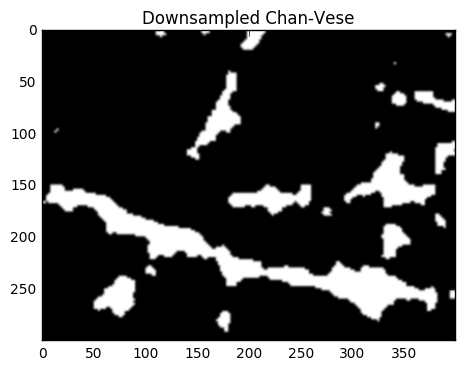

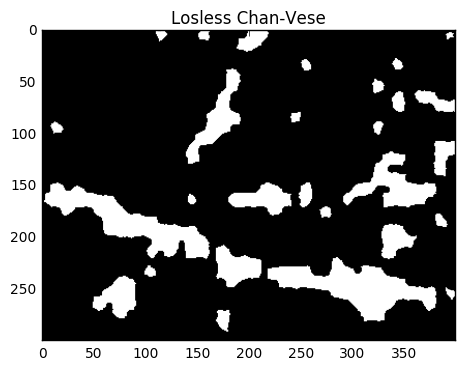

In [178]:
axonImg = data[34, 300:600, 200:600]
axonThresh, _ = extractAxons([axonImg])

axonThresh = axonThresh[0]

start = time.time()
imgDown = pyramid_reduce(axonThresh)

mask = cv2.dilate(imgDown, None, 5)
seg, _, _ = chanvese(imgDown, mask)

imgUp = pyramid_expand(seg)
end = time.time()

print 'Downsampled Chan-Vese Took: ', end-start

start = time.time()
mask = cv2.dilate(axonThresh, None, 5)
seg, _, _ = chanvese(axonThresh, mask)
end = time.time()

print 'Lossless Chan-Vese Took: ', end-start

plt.figure()
plt.imshow(imgUp, cmap='gray')
plt.title('Downsampled Chan-Vese')
plt.show()

plt.figure()
plt.imshow(seg, cmap='gray')
plt.title('Losless Chan-Vese')
plt.show()

The pyramidal downsample performed better, at least qualitatively, in every way. The resulting mask was not only more smoothly connected, but image artifacts were eroded away in the process. This, in addition to the almost 4x speed increase, means downsampling is the way to go

The time required is still quite large, though, about 10 minutes for the whole volume. We may be able to achieve higher speed if the algorithm is converging before the default iteration number

Time to test that

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
100 Iteration Chan-Vese Took:  1.11701703072
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
200 Iteration Chan-Vese Took:  1.1344408989


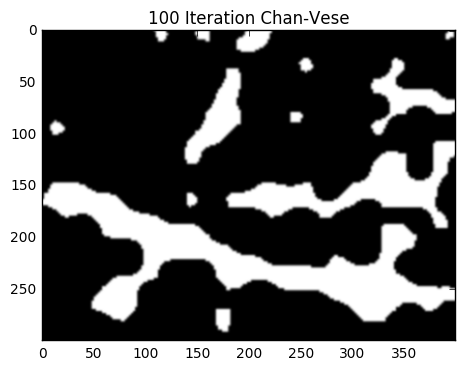

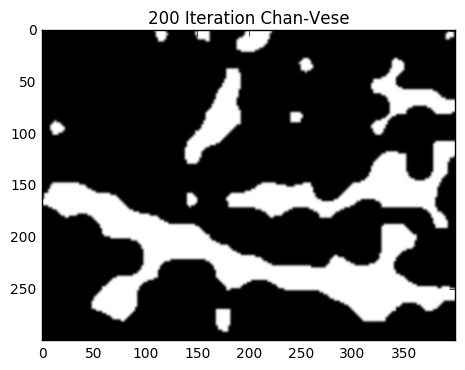

In [186]:
axonImg = data[34, 300:600, 200:600]
axonThresh, _ = extractAxons([axonImg])

axonThresh = axonThresh[0]

start = time.time()
imgDown = pyramid_reduce(axonThresh)

mask = cv2.dilate(imgDown, None, 5)
seg, _, _ = chanvese(imgDown, mask, max_its=100)

imgUp1 = pyramid_expand(seg)
end = time.time()

print '100 Iteration Chan-Vese Took: ', end-start


start = time.time()
imgDown = pyramid_reduce(axonThresh)

mask = cv2.dilate(imgDown, None, 5)
seg, _, _ = chanvese(imgDown, mask, max_its=100)

imgUp2 = pyramid_expand(seg)
end = time.time()

print '200 Iteration Chan-Vese Took: ', end-start

plt.figure()
plt.imshow(imgUp1, cmap='gray')
plt.title('100 Iteration Chan-Vese')
plt.show()

plt.figure()
plt.imshow(imgUp2, cmap='gray')
plt.title('200 Iteration Chan-Vese')
plt.show()

Convergence is evident in under 100 iterations. Can we go lower?

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
50 Iteration Chan-Vese Took:  0.605160951614
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
200 Iteration Chan-Vese Took:  1.14775490761


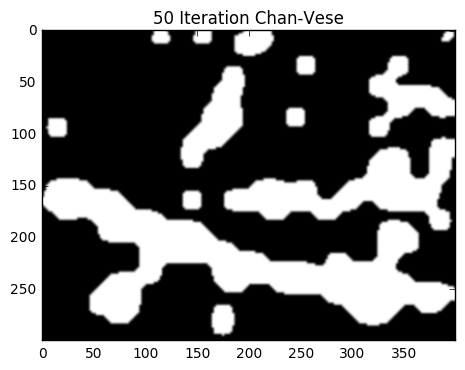

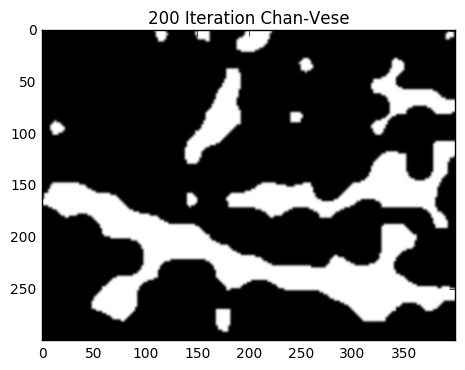

In [189]:
axonImg = data[34, 300:600, 200:600]
axonThresh, _ = extractAxons([axonImg])

axonThresh = axonThresh[0]

start = time.time()
imgDown = pyramid_reduce(axonThresh)

mask = cv2.dilate(imgDown, None, 5)
seg, _, _ = chanvese(imgDown, mask, max_its=50)

imgUp1 = pyramid_expand(seg)
end = time.time()

print '50 Iteration Chan-Vese Took: ', end-start


start = time.time()
imgDown = pyramid_reduce(axonThresh)

mask = cv2.dilate(imgDown, None, 5)
seg, _, _ = chanvese(imgDown, mask, max_its=100)

imgUp2 = pyramid_expand(seg)
end = time.time()

print '200 Iteration Chan-Vese Took: ', end-start

plt.figure()
plt.imshow(imgUp1, cmap='gray')
plt.title('50 Iteration Chan-Vese')
plt.show()

plt.figure()
plt.imshow(imgUp2, cmap='gray')
plt.title('200 Iteration Chan-Vese')
plt.show()

Looks like 50 iterations may be pushing it, and the artifacts in the image are beginning to reappear after so few iterations, as the algorithm has not progressed enough to consider them background yet.

I think the best way to procede from here is to try axon segmentation on the whole volume at a series of iteration numbers and compare the results

In [3]:
def segmentAxons(imgStack, downsampleFactor=2, dils=5, iterations=200):
    retStack = []
    for img in imgStack:
        imgDown =  pyramid_reduce(img, downsampleFactor)
        mask = cv2.dilate(imgDown, None, dils)
        seg, _, _ = chanvese(imgDown, mask, max_its=iterations)
        imgUp = pyramid_expand(seg)
        retStack.append(imgUp)
    return np.stack(retStack)

In [195]:
start = time.time()
axonImg, _ = extractAxons(data)
end = time.time()
print "Axon Extraction Took: ", end - start

Axon Extraction Took:  22.1041049957


In [198]:
start = time.time()
segmentedVolume = segmentAxons(axonImg, iterations=50)
end = time.time()
print "Axon Segmentation Took: ", end - start

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 0
iteration: 10
iterati

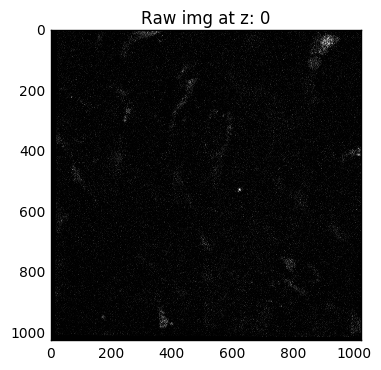

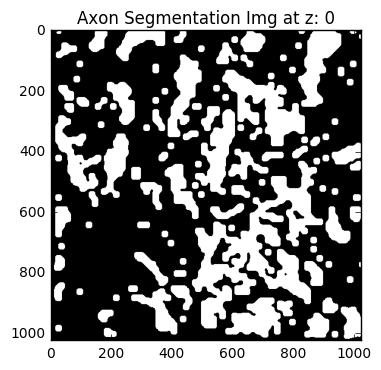

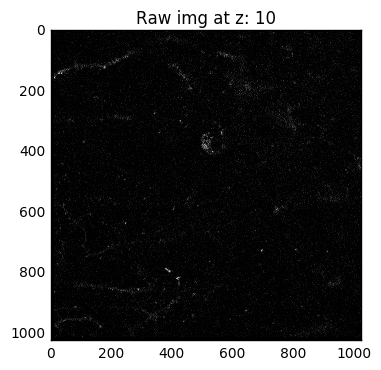

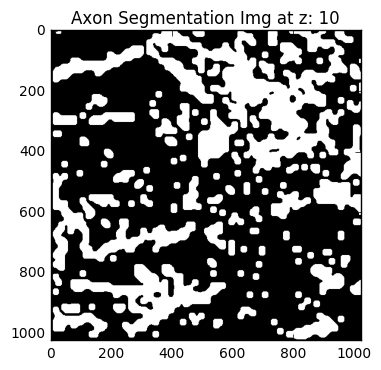

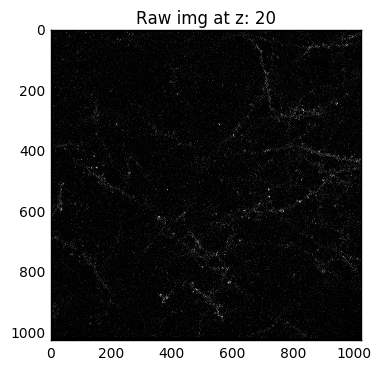

...

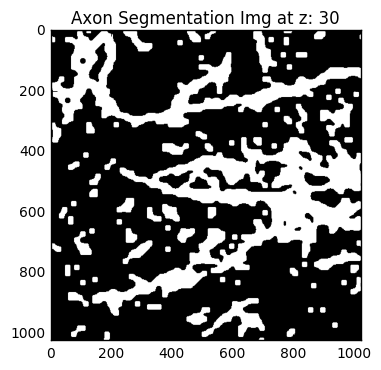

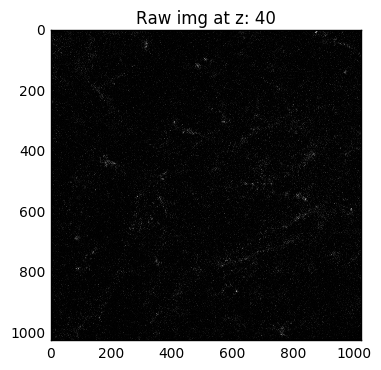

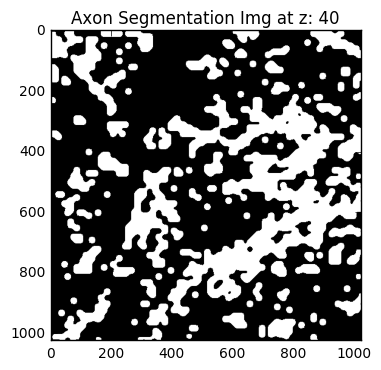

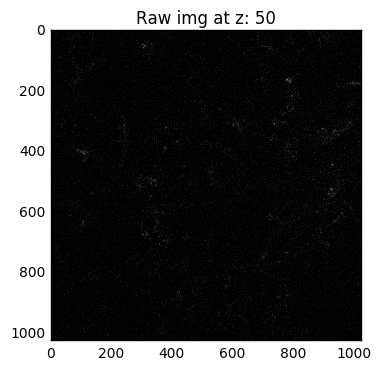

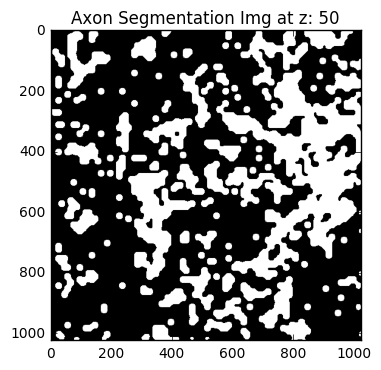

In [200]:
for i in range(0, 60, 10):
    plt.figure()
    plt.imshow(data[i], cmap='gray')
    plt.title('Raw img at z: '+ str(i))
    plt.show()
    
    plt.figure()
    plt.imshow(segmentedVolume[i], cmap='gray')
    plt.title('Axon Segmentation Img at z: '+ str(i))
    plt.show()
    print '\n\n\n\n'


These results leave a lot to be desired. Time to run it with 100 iterations and see what that buys us

In [201]:
start = time.time()
segmentedVolume = segmentAxons(axonImg, iterations=100)
end = time.time()
print "Axon Segmentation Took: ", end - start

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90
iteration: 0
iteration: 10


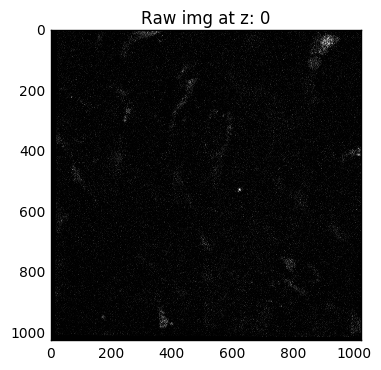

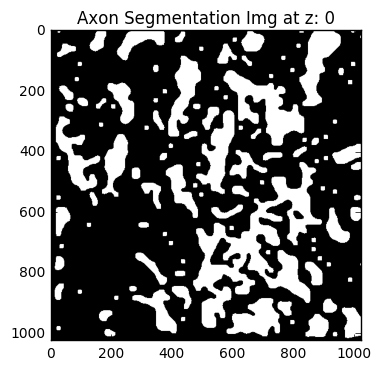

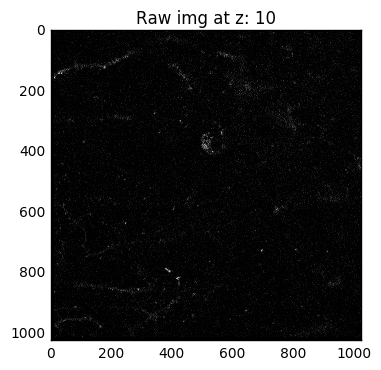

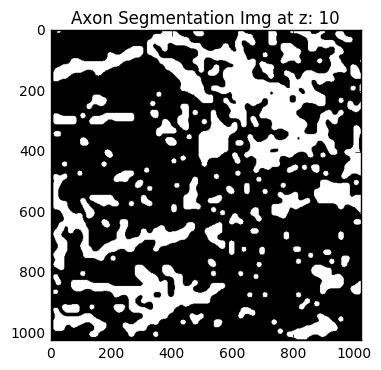

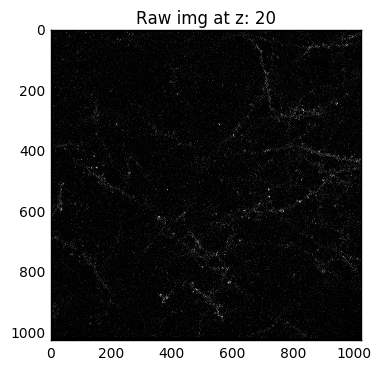

...

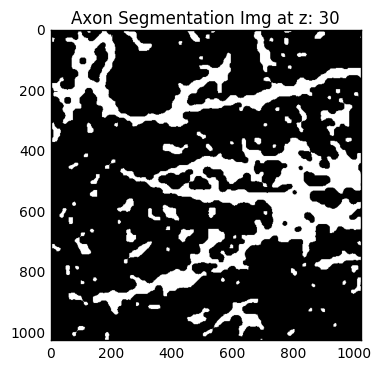

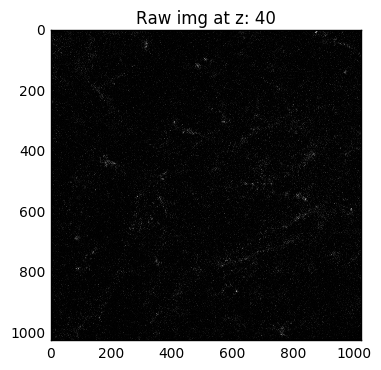

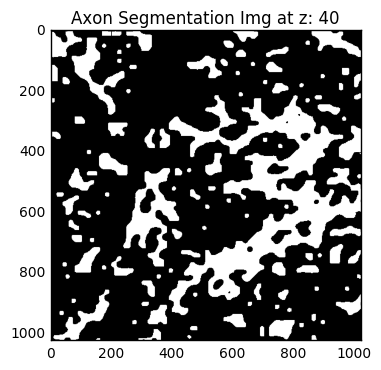

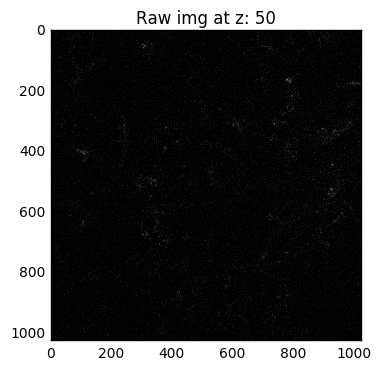

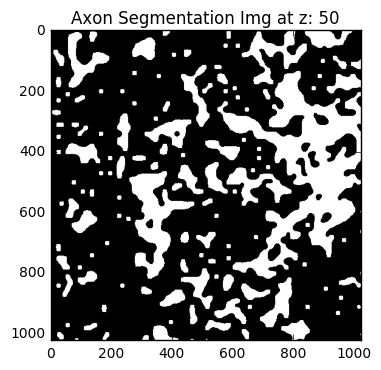

In [202]:
for i in range(0, 60, 10):
    plt.figure()
    plt.imshow(data[i], cmap='gray')
    plt.title('Raw img at z: '+ str(i))
    plt.show()
    
    plt.figure()
    plt.imshow(segmentedVolume[i], cmap='gray')
    plt.title('Axon Segmentation Img at z: '+ str(i))
    plt.show()
    print '\n\n\n\n'


Again, the results here leave a lot to be desired. It is clear that running for the same number of iterations on a larger image will not result in the same quality as running in segments at a time.

The next step is to give running in segments at a time a go

In [7]:
def parallel_chanvese(img, iterations, dils, yThreads=4, xThreads=4):

    #define an output queue
    output = mp.Queue()
    
    def _chanvese(reduceOrd, img, iterations=100, dils=5, downsampleFactor=2):    
        imgDown =  pyramid_reduce(img, downsampleFactor)
        mask = cv2.dilate(imgDown, None, dils)
        seg, _, _ = chanvese(imgDown, mask, max_its=iterations)
        imgUp = pyramid_expand(seg, downsampleFactor)
        output.put((reduceOrd, seg))
        return
        
    #break the image to the appropriate number of sub threads
    yStep = img.shape[0]/yThreads
    xStep = img.shape[1]/xThreads
    subregions = []
    for y in range(0, img.shape[0], yStep):
        for x in range(0, img.shape[1], xStep):
            subregions.append(img[y:y+yStep, x:x+xStep])
            
    #define process map
    threads = [mp.Process(target = _chanvese,
                          args=(i,
                                subregions[i],
                                iterations,
                                dils
                            )) for i in range(len(subregions))]
    
    #run the threads
    for t in threads:
        t.start()
    
    for t in threads:
        t.join(.01)
    
    #reduce the results
    results = [output.get() for t in threads]
    resSort = sorted(results, key=lambda x: x[0])   
    redVol = []
    for y in range(yThreads):
        row = []
        for x in range(xThreads):
            resIdx = yThreads*y+x
            row.append(resSort[resIdx][1])
        redVol.append(np.hstack(row))

    return np.vstack(redVol), resSort

In [31]:
start = time.time()
res, sub = parallel_chanvese(data[20], 50, 1)
end = time.time()
print 'Parallel took: ', end-start

iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 10
iteration: 0
iteration: 0
iteration: 10
iteration: 0
iteration: 10
iteration: 0
iteration: 0
iteration: 0
iteration: 10
iteration: 0
iteration: 20
iteration: 20
iteration: 0
iteration: 20
iteration: 0
iteration: 10
iteration: 0
iteration: 0
iteration: 20
iteration: 30
iteration: 10
iteration: 30
iteration: 30
iteration: 10
iteration: 0
iteration: 0
iteration: 10
iteration: 10
iteration: 10
iteration: 0
iteration: 0
iteration: 0
iteration: 10
iterati

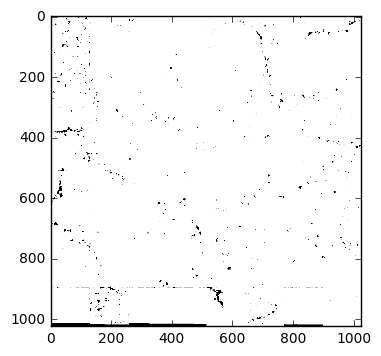

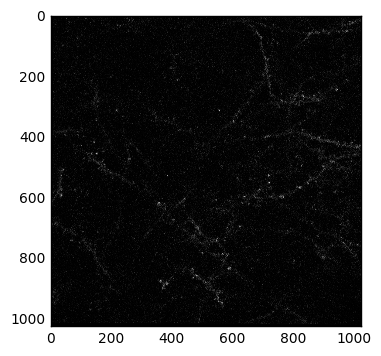

In [32]:
plt.figure()
plt.imshow(res, cmap='gray')
plt.show()

plt.figure()
plt.imshow(data[20], cmap='gray')
plt.show()

Not sure why the reconstructed segmentation is inverted and shitty. Time to take a closer look at the pieces to try and get a better idea of what's going on

In [33]:
def _chanvese(reduceOrd, img, iterations=100, dils=5):
    mask = cv2.dilate(img, None, dils)
    seg, _, _ = chanvese(img, mask, max_its=iterations)
    return reduceOrd, seg

In [15]:
axonImg = data[34, 300:600, 200:600]
_, out = _chanvese(1, axonImg)

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90


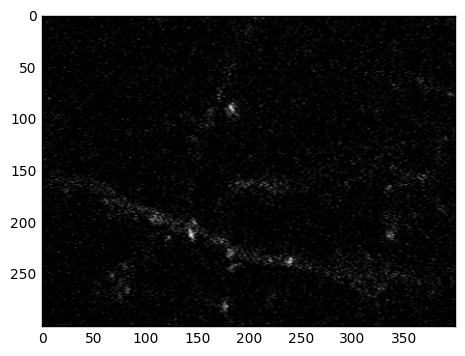

In [16]:
plt.figure()
plt.imshow(axonImg, cmap='gray')
plt.show()

In [34]:
axonImg = data[34, 300:600, 200:600]
axonThresh, _ = extractAxons([axonImg])

In [35]:
_, out = _chanvese(1, axonThresh[0])

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90


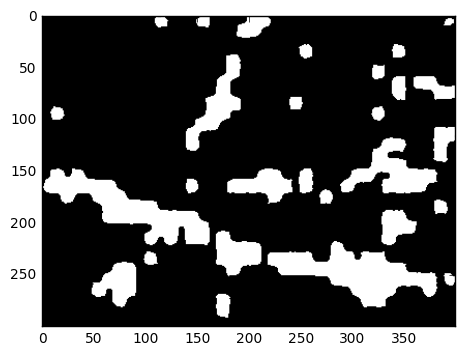

In [36]:
plt.figure()
plt.imshow(out, cmap='gray')
plt.show()

This is what happens when you're working at 3 in the morning. You forget to run the data through all steps of the pipeline, and then wonder why things arent working

In [37]:
def _chanvese(reduceOrd, img, iterations=100, dils=5, downsampleFactor=2):    
    imgDown =  pyramid_reduce(img, downsampleFactor)
    mask = cv2.dilate(imgDown, None, dils)
    seg, _, _ = chanvese(imgDown, mask, max_its=iterations)
    imgUp = pyramid_expand(seg)
    return reduceOrd, imgUp

In [38]:
axonImg = data[34, 300:600, 200:600]
axonThresh, _ = extractAxons([axonImg])
_, out = _chanvese(1, axonThresh[0])

iteration: 0
iteration: 10
iteration: 20
iteration: 30
iteration: 40
iteration: 50
iteration: 60
iteration: 70
iteration: 80
iteration: 90


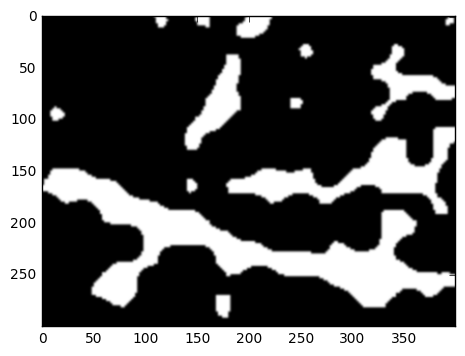

In [39]:
plt.figure()
plt.imshow(out, cmap='gray')
plt.show()

In [50]:
axonThresh, _ = extractAxons([data[20]])

start = time.time()
res, sub = parallel_chanvese(axonThresh[0], 50, 1)
end = time.time()
print 'Parallel took: ', end-start

iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 20
iteration: 20
iteration: 20
iteration: 10
iteration: 30
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 20
iteration: 20
iteration: 10
iteration: 10
iteration: 10
iteration: 30
iteration: 30
iteration: 20
iteration: 30
iteration: 30
iteration: 40
iteration: 20
iteration: 30
iteration: 30
iteration: 20
iteration: 20
iteration: 40
iteration: 20
iteration: 30
iteration: 20
iteration: 20
iteration: 30
iteration: 20
iteration: 40
iteration: 40
iteration: 40
iteration: 40
iteration: 30
iteration: 40
iteration: 30
iteration: 40
iteration: 30
iteration: 30
iteration: 30
iteration: 40
iteration: 30
iteratio

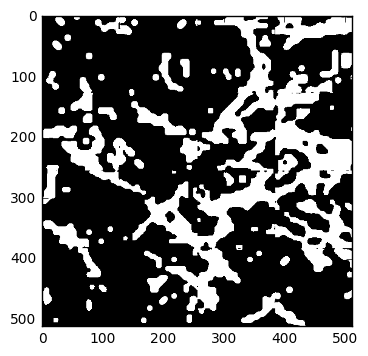

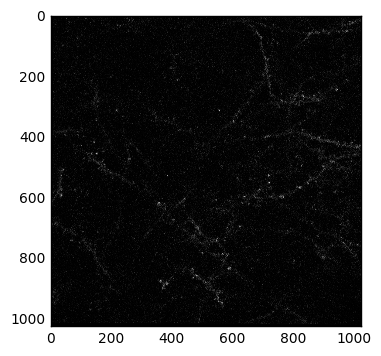

In [51]:
plt.figure()
plt.imshow(res, cmap='gray')
plt.show()

plt.figure()
plt.imshow(data[20], cmap='gray')
plt.show()

In [52]:
axonThresh, _ = extractAxons([data[20]])

start = time.time()
res, sub = parallel_chanvese(axonThresh[0], 100, 2)
end = time.time()
print 'Parallel took: ', end-start

iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 20
iteration: 30
iteration: 20
iteration: 10
iteration: 20
iteration: 20
iteration: 30
iteration: 20
iteration: 30
iteration: 20
iteration: 20
iteration: 20
iteration: 20
iteration: 10
iteration: 20
iteration: 20
iteration: 40
iteration: 30
iteration: 30
iteration: 30
iteration: 20
iteration: 40
iteration: 30
iteration: 30
iteration: 40
iteration: 50
iteration: 30
iteration: 50
iteration: 30
iteration: 40
iteration: 30
iteration: 30
iteration: 30
iteration: 40
iteration: 40
iteration: 30
iteration: 40
iteration: 40
iteration: 30
iteratio

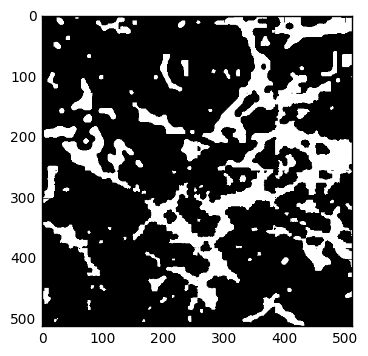

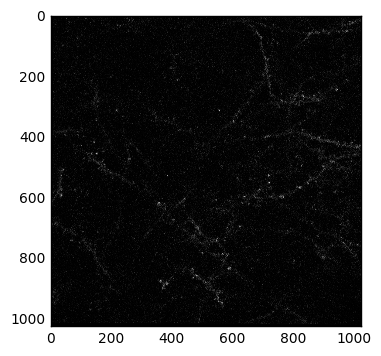

In [53]:
plt.figure()
plt.imshow(res, cmap='gray')
plt.show()

plt.figure()
plt.imshow(data[20], cmap='gray')
plt.show()

In [54]:
axonThresh, _ = extractAxons([data[20]])

start = time.time()
res, sub = parallel_chanvese(axonThresh[0], 200, 2)
end = time.time()
print 'Parallel took: ', end-start

iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 0
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 20
iteration: 10
iteration: 10
iteration: 30
iteration: 20
iteration: 20
iteration: 10
iteration: 30
iteration: 20
iteration: 20
iteration: 20
iteration: 10
iteration: 30
iteration: 20
iteration: 20
iteration: 30
iteration: 40
iteration: 30
iteration: 30
iteration: 20
iteration: 40
iteration: 20
iteration: 30
iteration: 30
iteration: 30
iteration: 20
iteration: 40
iteration: 40
iteration: 30
iteration: 40
iteration: 50
iteration: 30
iteration: 40
iteration: 50
iteration: 40
iteration: 30
iteration: 30
iteration: 30
iteration: 40
iteration: 30
iteratio

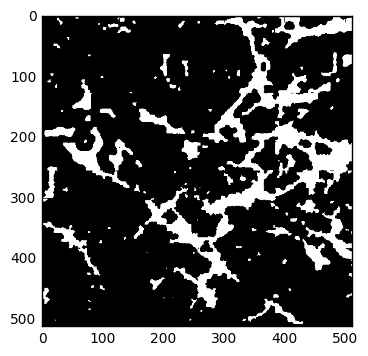

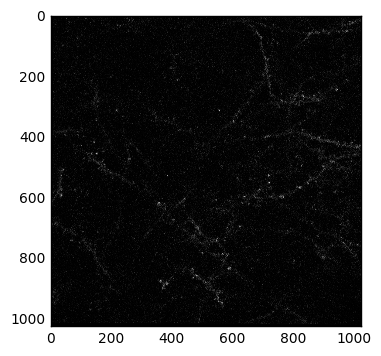

In [55]:
plt.figure()
plt.imshow(res, cmap='gray')
plt.show()

plt.figure()
plt.imshow(data[20], cmap='gray')
plt.show()

This segmentation seems very promising, but at 5 seconds per slice, there is still room for improvement. In the cloud, we may be able to run every slice in parallel as well as the algorithm in parallel, though, which would make things hella speedy

Before we get ahead of ourselves with synapse detection, let's look at the results in 3D and be sure that things are doing what we want them to

In [ ]:
axonThreshStack, _ = extractAxons(data)

start = time.time()
outStack = []

for axonThresh in axonThreshStack:
    res, sub = parallel_chanvese(axonThresh, 200, 2)
    outStack.append(res)
    
outStack = np.stack(outStack)
end = time.time()

print 'Parallel took: ', end-start

Turns out parallel processing in a jupyter notebook is a great way to crash your jupyter kernel. Time to migrate everything to libs and run off of a notebook. Results will be pickled and imported below

In [24]:
testData = pickle.load(open('../code/functions/axonSegments.dat', 'r'))

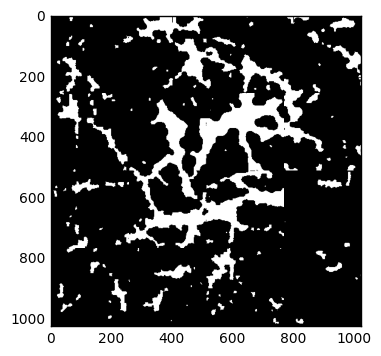

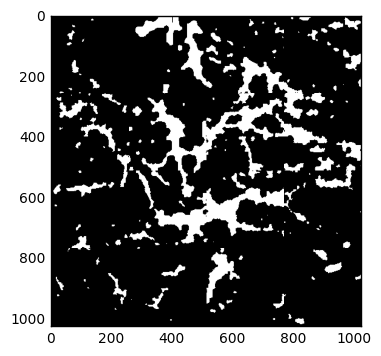

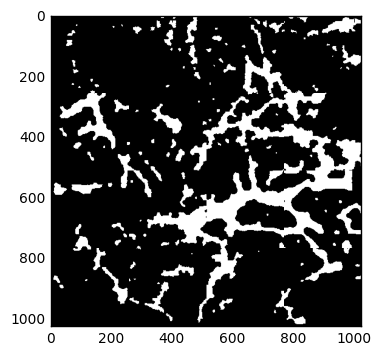

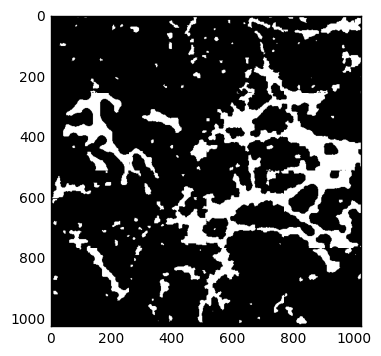

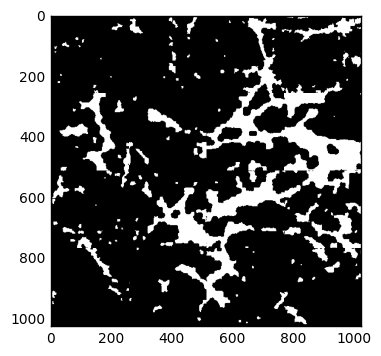

In [25]:
for elem in testData:
    plt.figure()
    plt.imshow(elem, cmap='gray')
    plt.show()

The uniform nature of this detection tells me that we are successfully extracting axon clusters. Next up is to follow along each axon cluster, and extract the synapses near it

In [26]:
testSlice = testData[0]

In [27]:
class axonPath:
    def __init__(self, members):
        self._members = members        

In [28]:
def generateAxonPaths(img, mask):
    labels = label(mask)
    axons = []
    for i in range(np.max(labels)):
        locations = zip(*(np.where(labels==i)))
        members = [(location[0], location[1], img[location[0]][location[1]]) for location in locations]
        axons.append(axonPath(members))
    return axons

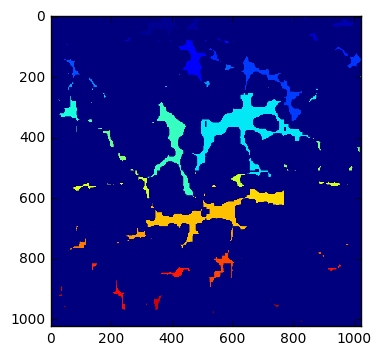

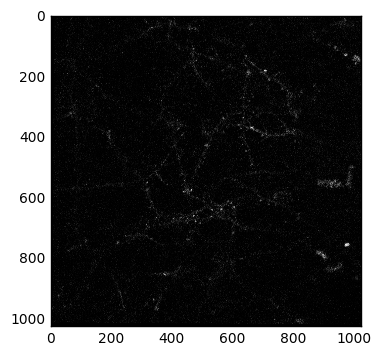

In [29]:
plt.figure()
plt.imshow(label(testSlice))
plt.show()

plt.figure()
plt.imshow(data[15], cmap='gray')
plt.show()

In [30]:
axons = generateAxonPaths(data[15], testSlice)

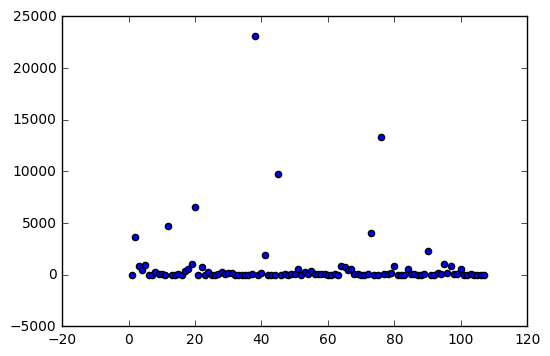

In [31]:
plt.figure()
plt.scatter([i for i in range(1, len(axons))], [len(axons[i]._members) for i in range(1, len(axons))])
plt.show()

valid = []
for i, elem in enumerate(axons):
    if len(elem._members) > 100:
        valid.append(i)

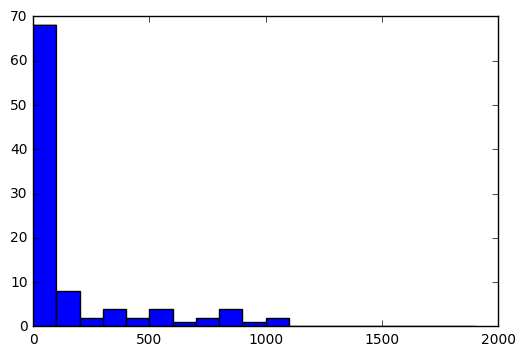

In [32]:
plt.figure()
plt.hist([len(axons[i]._members) for i in range(1, len(axons))], bins=range(0, 2000, 100))
plt.show()

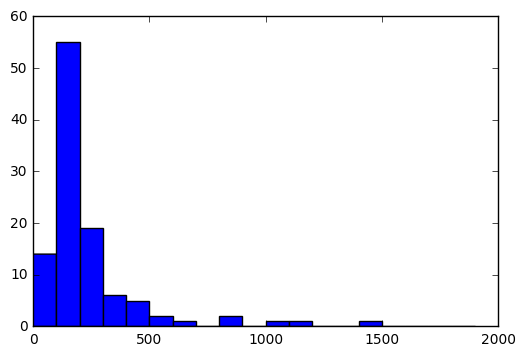

In [37]:
plt.figure()
plt.hist([np.average([elem[2] for elem in axon._members]) for axon in axons], bins = range(0, 2000, 100))
plt.show()

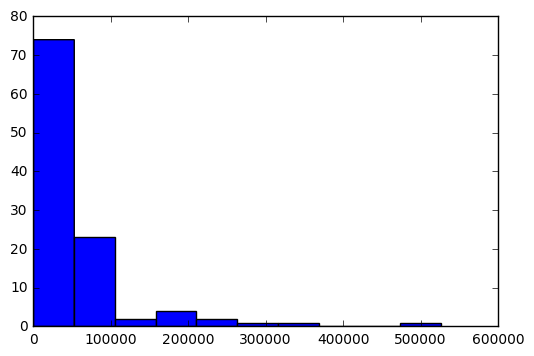

In [41]:
plt.figure()
plt.hist([np.var([elem[2] for elem in axon._members]) for axon in axons])
plt.show()

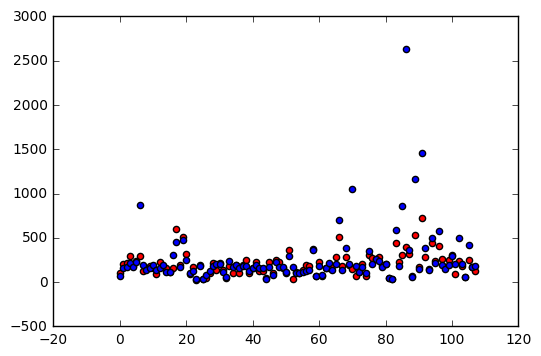

In [43]:
plt.figure()
plt.scatter(range(len(axons)), [np.sqrt(np.var([elem[2] for elem in axon._members])) for axon in axons], c='r')
plt.scatter(range(len(axons)), [np.mean([elem[2] for elem in axon._members]) for axon in axons], c='b')
plt.show()

Now that we can read axon paths into structures, its time to follow them through the image and pick up the synapses along their edges

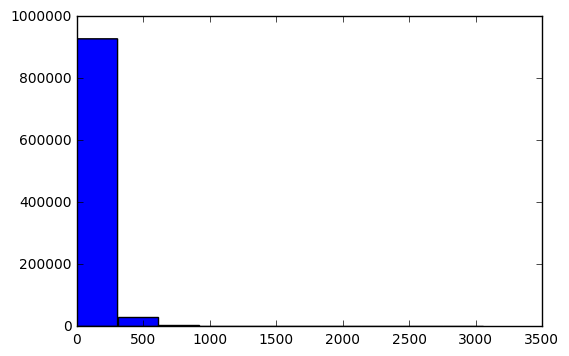

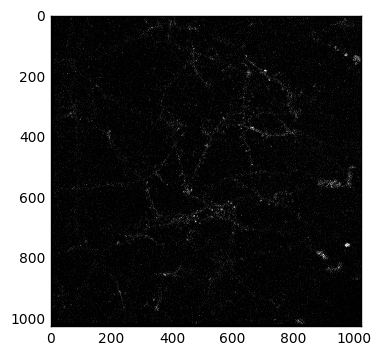

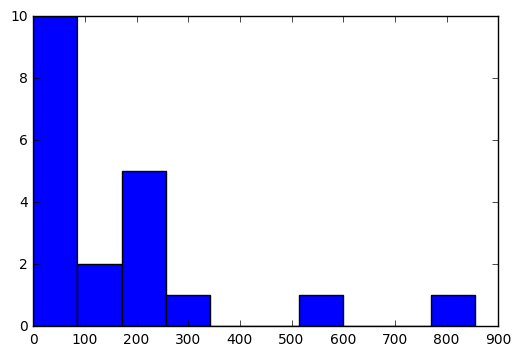

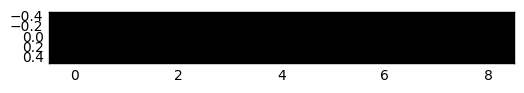

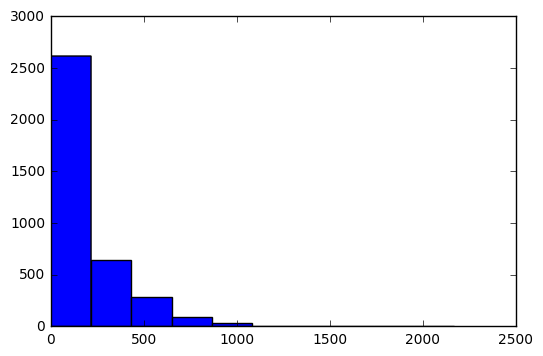

...

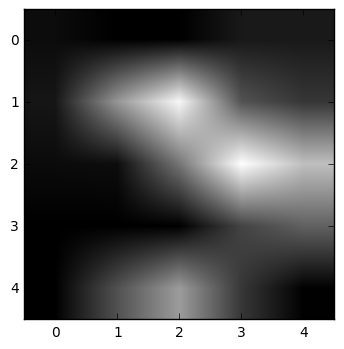

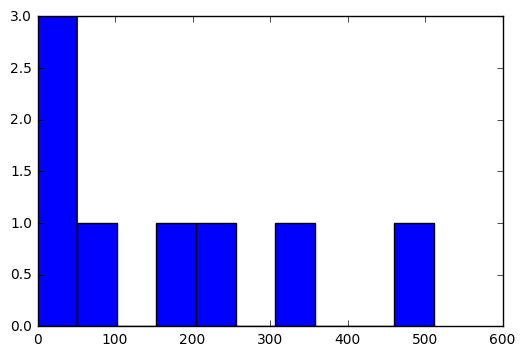

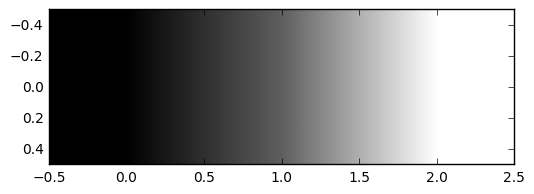

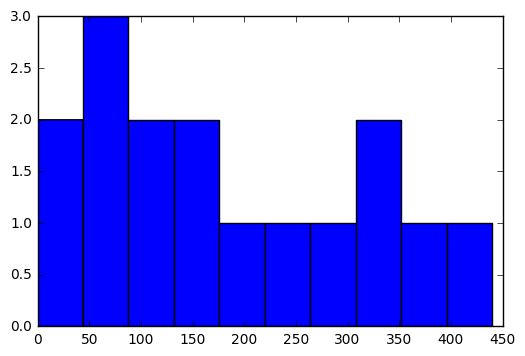

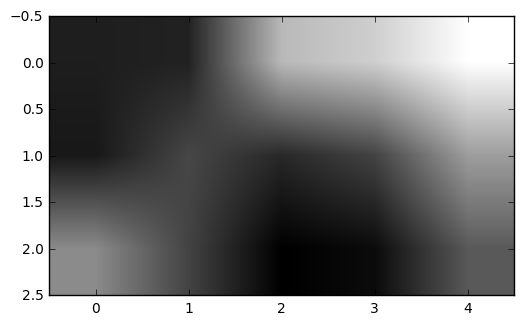

In [34]:
for axon in axons:
    plt.figure()
    plt.hist([elem[2] for elem in axon._members])
    plt.show()
    
    plt.figure()
    yList = [elem[1] for elem in axon._members]
    xList = [elem[0] for elem in axon._members]
    
    plt.imshow(data[15,np.min(yList):np.max(yList), np.min(xList):np.max(xList)], cmap='gray')
    plt.show()
    
    print '\n\n\n'

In [48]:
valid = []
imgMean = np.mean(data[15])
imgVar = np.var(data[15])
for axon in axons:
    if np.mean([elem[2] for elem in axon._members]) > imgMean:
        valid.append(axon)

In [49]:
len(valid)

96

It has become clear to me that i need a nice visualization function in order to continue with any direction

In [51]:
def visAxons(img, axons):
    out = np.zeros_like(img)
    for axon in axons:
        for member in axon._members:
            out[member[0]][member[1]] = member[2]
    return out

In [52]:
img = visAxons(data[15], valid)

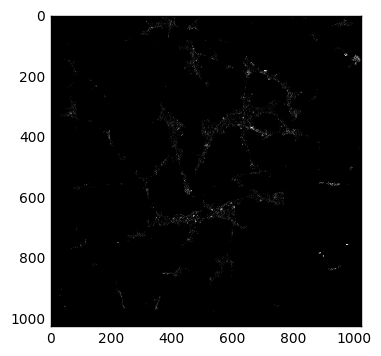

In [55]:
plt.figure()
plt.imshow(img, cmap='gray')
plt.show()

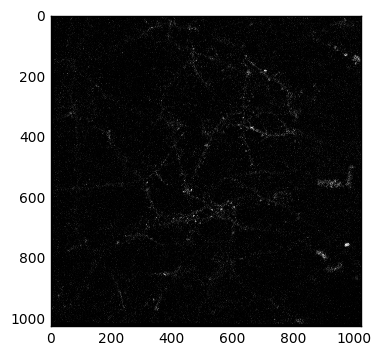

In [58]:
img2 = visAxons(data[15], axons)
plt.figure()
plt.imshow(img2, cmap='gray')
plt.show()

After playing with this chan vese idea for far too longl, i think that it may be too complex for the task at hand. I am going to try to revert to something simpler from here